In [2]:
# Parámetros a configurar:
import os
experiment_name = "command13"
task_name = "Command13"
cfg_dir = "C:/Users/Teresa/Documents/GitHub/navsim/isaac_lab/aerotaxi/env_command/env_17/grid_hiperparametros/cfg_files"
path_resultados = "C:/Users/Teresa/Documents/GitHub/navsim/tmp/tmpTeresa/resultados_grid_command_v13"
isaaclab_bat = "C:/Users/Teresa/Desktop/RuralData/IsaacLab/IsaacLab/isaaclab.bat"
train_script = "C:/Users/Teresa/Documents/GitHub/navsim/isaac_lab/rl_v5_1_0/rsl_rl/train.py"
id_task = f"Isaac-{task_name}-Aerotaxi-RANDOM" # luego se le añade el número de task con el guión (Isaac-Command2-Aerotaxi-RANDOM-34)
play_script = "C:/Users/Teresa/Documents/GitHub/navsim/isaac_lab/rl_v5_1_0/rsl_rl/play.py"
num_iter = "4001"
num_steps_per_env = 128
powershell_script = os.path.join(cfg_dir, "run_all.ps1")

# el num_steps_per_env = 100 también está en el env, al final del todo, y deben tener el mismo valor
# Recuerda iniciar en el init todos los experimentos

In [4]:
import random
import os

# Si los directorios no existen (el último indicado), lo crea
os.makedirs(cfg_dir, exist_ok=True)
os.makedirs(path_resultados, exist_ok=True)
# Opciones de hiperparámetros
param_options = {
    "init_noise_std": [0.0, 0.1, 0.2, 0.5, 0.8, 1.0],
    "actor_hidden_dims": [[64, 64], [128, 128], [256, 256], [128, 64]],
    "critic_hidden_dims": [[64, 64], [128, 128], [256, 256]],
    "activation": ["relu", "tanh", "elu", "gelu"],
    "value_loss_coef": [0.5, 1.0, 2.0],
    "clip_param": [0.1, 0.2, 0.3],
    "entropy_coef": [0.0, 0.001, 0.01, 0.05],
    "num_learning_epochs": [4, 8, 12],
    "num_mini_batches": [2, 4, 8],
    "learning_rate": [5e-05, 1e-4, 3e-4, 1e-3, 3e-3],
    "gamma": [0.95, 0.98, 0.99],
    "lam": [0.90, 0.95, 0.97],
    "max_grad_norm": [0.5, 1.0, 2.0],
    "desired_kl": [0.005, 0.008, 0.01, 0.02],
}

num_trials = 35  # cantidad de configuraciones

cfg_files = []

for i in range(num_trials):
    run_name = f"ppo_random_{experiment_name}_{i+1}"
    sampled = {k: random.choice(v) for k, v in param_options.items()}

    # Convertir listas a string
    actor_dims = sampled["actor_hidden_dims"]
    critic_dims = sampled["critic_hidden_dims"]

    cfg_content = f"""
from isaaclab.utils import configclass
from isaaclab_rl.rsl_rl import RslRlOnPolicyRunnerCfg, RslRlPpoActorCriticCfg, RslRlPpoAlgorithmCfg

@configclass
class {task_name}PPORunnerCfg(RslRlOnPolicyRunnerCfg):
    num_steps_per_env = {num_steps_per_env} 
    max_iterations = {num_iter}
    save_interval = 100
    experiment_name = "{experiment_name}"
    run_name = "{run_name}"
    resume = False
    empirical_normalization = True
    csv_path_metrics = "{path_resultados}"
    callbacks = True
    policy = RslRlPpoActorCriticCfg(
        init_noise_std={sampled['init_noise_std']},
        actor_hidden_dims={actor_dims},
        critic_hidden_dims={critic_dims},
        activation="{sampled['activation']}",
    )
    algorithm = RslRlPpoAlgorithmCfg(
        value_loss_coef={sampled['value_loss_coef']},
        use_clipped_value_loss=True,
        clip_param={sampled['clip_param']},
        entropy_coef={sampled['entropy_coef']},
        num_learning_epochs={sampled['num_learning_epochs']},
        num_mini_batches={sampled['num_mini_batches']},
        learning_rate={sampled['learning_rate']},
        schedule="adaptive",
        gamma={sampled['gamma']},
        lam={sampled['lam']},
        desired_kl={sampled['desired_kl']},
        max_grad_norm={sampled['max_grad_norm']},
    )
"""
    cfg_path = os.path.join(cfg_dir, f"{run_name}_cfg.py")
    with open(cfg_path, "w") as f:
        f.write(cfg_content.strip())
    cfg_files.append((run_name, cfg_path))

# Crear archivo PowerShell para ejecutar todas las configuraciones
powershell_script = os.path.join(cfg_dir, "run_all.ps1")

num_envs =  [64, 128, 512, 1024, 2048, 4096, 8196] #número de entornos para train (paralelizados)

with open(powershell_script, "w") as f:
    f.write("$ErrorActionPreference = 'Stop'\n\n")
    j = 0
    for run_name, cfg_path in cfg_files:
        # Convertir path a módulo Python (reemplazar / y .py)
        num_envs_i = 8196
        module_path = cfg_path.replace("/", ".").replace("\\", ".").replace(".py", "")
        f.write(f'Write-Host "Ejecutando {run_name}"\n')
        f.write(f'& "{isaaclab_bat}" -p "{train_script}" --task {id_task}-{j+1} --num_envs {num_envs_i} --headless \n\n')
        j += 1
print("Archivos de configuración generados y script PowerShell listo en:", powershell_script)

Archivos de configuración generados y script PowerShell listo en: C:/Users/Teresa/Documents/GitHub/navsim/isaac_lab/aerotaxi/env_command/env_17/grid_hiperparametros/cfg_files\run_all.ps1


In [ ]:
# Ejecuta el entrenamiento de forma automática
# !powershell -ExecutionPolicy Bypass -File "{powershell_script}"
import subprocess
import sys

# Ruta al script que generaste
powershell_script_path = powershell_script 

print(f"Iniciando ejecución de: {powershell_script_path}\n")

# Ejecutamos el proceso capturando la salida en tiempo real
process = subprocess.Popen(
    ["powershell.exe", "-ExecutionPolicy", "Bypass", "-File", powershell_script_path],
    stdout=subprocess.PIPE,
    stderr=subprocess.STDOUT, # Redirigimos errores a la salida estándar para verlos
    text=True,
    bufsize=1
)

# Leemos la salida línea a línea conforme se genera
try:
    for line in process.stdout:
        print(line, end="") # Imprime la salida de PowerShell en la celda
        sys.stdout.flush()   # Fuerza a Jupyter a mostrar la línea inmediatamente
except KeyboardInterrupt:
    process.kill()
    print("\nEntrenamiento cancelado por el usuario.")

process.wait()
print("\n--- Todos los experimentos han finalizado ---")

Iniciando ejecución de: C:/Users/Teresa/Documents/GitHub/navsim/isaac_lab/aerotaxi/env_command/env_17/grid_hiperparametros/cfg_files\run_all.ps1

Ejecutando ppo_random_command13_1
[INFO] Using python from: C:\Users\Teresa\miniconda3\envs\env_isaaclab\python.exe
[INFO][AppLauncher]: Using device: cuda:0
[INFO][AppLauncher]: Loading experience file: C:\Users\Teresa\miniconda3\envs\env_isaaclab\Lib\site-packages\isaaclab\apps\isaaclab.python.headless.kit
Loading user config located at: 'c:/users/teresa/miniconda3/envs/env_isaaclab/lib/site-packages/isaacsim/kit/data/Kit/Isaac-Sim/5.1/user.config.json'
[Info] [carb] Logging to file: c:/users/teresa/miniconda3/envs/env_isaaclab/lib/site-packages/isaacsim/kit/logs/Kit/Isaac-Sim/5.1/kit_20260319_125510.log
2026-03-19T11:55:10Z s] [Warning] [omni.usd_config.extension] Enable omni.materialx.libs extension to use MaterialX
2026-03-19T11:55:10Z s] [Warning] [carb] Acquiring non optional plugin interface which is not listed as dependency: [omni::p

``Análisis de los datos``

In [3]:
import csv
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

seed = 42
n=5

df_results_grid_actions = pd.read_csv(path_resultados+"/resultados_grid_PPO.csv")

In [4]:
def get_group(value):
    if f"_{experiment_name}" in value:
        return task_name

df_results_grid_actions["tarea"] = df_results_grid_actions["id_run_name"].apply(get_group)

In [5]:
df_copy = df_results_grid_actions.copy()
df_results_grid_actions.sample(n, random_state=seed)

,id_run_name,iteration,reward,max_reward,std_reward,num_envs_train,mean_Episode_Reward/rew_attitude_stability2,mean_Episode_Reward/rew_ang_vel_stability4,mean_Episode_Reward/rew_pos2,mean_Episode_Reward/rew_action_rate,mean_Episode_Reward/rew_heading,mean_Episode_Reward/rew_track_vel3,mean_Episode_Termination/time_out,mean_Episode_Termination/below_min_altitude,mean_Episode_Termination/bad_attitude,mean_Episode_Termination/safety_shutdown,tarea
81,ppo_random_command13_10,500,303.238287,343.247528,35.960817,8196,1.803377,0.868277,1.333802,-1.547235,2.445730,7.385069,0.947843,0.046586,0.005571,0.000000,Command13
142,ppo_random_command13_18,0,9.237240,27.443165,5.273168,8196,0.046124,0.031211,0.052756,-0.000003,0.037715,0.110209,0.027743,0.001888,0.383998,0.000000,Command13
31,ppo_random_command13_5,600,349.726723,383.444122,25.527878,8196,1.836373,0.925537,1.309425,-0.016650,2.458835,7.388593,0.947954,0.051418,0.000628,0.000000,Command13
29,ppo_random_command13_5,400,334.856534,383.946747,36.074318,8196,1.819469,0.920292,1.143219,-0.010946,2.325539,7.287400,0.925036,0.063328,0.011636,0.000000,Command13
118,ppo_random_command13_15,300,305.470763,370.667572,50.454385,8196,1.862225,0.924212,0.553258,-0.194537,2.467854,6.244706,0.914552,0.035195,0.005024,0.045229,Command13


In [6]:
df_results_grid_actions.set_index(['tarea','id_run_name'],inplace=True)
top5 = (
    df_results_grid_actions.groupby(level="tarea")
      .apply(lambda g: g.sort_values("reward", ascending=False).head(5))
)

# Eliminar el nivel adicional que introduce groupby+apply
top5.index = top5.index.droplevel(0)

top5

iteration      reward  max_reward  \
tarea     id_run_name                                                 
Command13 ppo_random_command13_6        400  354.081411  386.428101   
          ppo_random_command13_6        500  352.593357  388.759857   
          ppo_random_command13_6        600  349.838243  391.923798   
          ppo_random_command13_5        600  349.726723  383.444122   
          ppo_random_command13_5       1000  348.467097  387.829010   

                                  std_reward  num_envs_train  \
tarea     id_run_name                                          
Command13 ppo_random_command13_6   20.070180            8196   
          ppo_random_command13_6   21.625575            8196   
          ppo_random_command13_6   30.044699            8196   
          ppo_random_command13_5   25.527878            8196   
          ppo_random_command13_5   25.811535            8196   

                                  mean_Episode_Reward/rew_attitude_stability2  \
tarea     id_run_name                                                           
Command13 ppo_random_command13_6                                     1.839478   
          ppo_random_command13_6                                     1.831433   
          ppo_random_command13_6                                     1.837320   
          ppo_random_command13_5                                     1.836373   
          ppo_random_command13_5                                     1.831610   

                                  mean_Episode_Reward/rew_ang_vel_stability4  \
tarea     id_run_name                                                          
Command13 ppo_random_command13_6                                    0.952155   
          ppo_random_command13_6                                    0.946635   
          ppo_random_command13_6                                    0.950248   
          ppo_random_command13_5                                    0.925537   
          ppo_random_command13_5                                    0.924070   

                                  mean_Episode_Reward/rew_pos2  \
tarea     id_run_name                                            
Command13 ppo_random_command13_6                      1.122954   
          ppo_random_command13_6                      1.231122   
          ppo_random_command13_6                      1.247906   
          ppo_random_command13_5                      1.309425   
          ppo_random_command13_5                      1.301452   

                                  mean_Episode_Reward/rew_action_rate  \
tarea     id_run_name                                                   
Command13 ppo_random_command13_6                            -0.001217   
          ppo_random_command13_6                            -0.001249   
          ppo_random_command13_6                            -0.001292   
          ppo_random_command13_5                            -0.016650   
          ppo_random_command13_5                            -0.046275   

                                  mean_Episode_Reward/rew_heading  \
tarea     id_run_name                                               
Command13 ppo_random_command13_6                         2.609074   
          ppo_random_command13_6                         2.571792   
          ppo_random_command13_6                         2.557819   
          ppo_random_command13_5                         2.458835   
          ppo_random_command13_5                         2.477759   

                                  mean_Episode_Reward/rew_track_vel3  \
tarea     id_run_name                                                  
Command13 ppo_random_command13_6                            7.416228   
          ppo_random_command13_6                            7.402648   
          ppo_random_command13_6                            7.436691   
          ppo_random_command13_5                            7.388593   
          ppo_random_command13_5                            7.40153

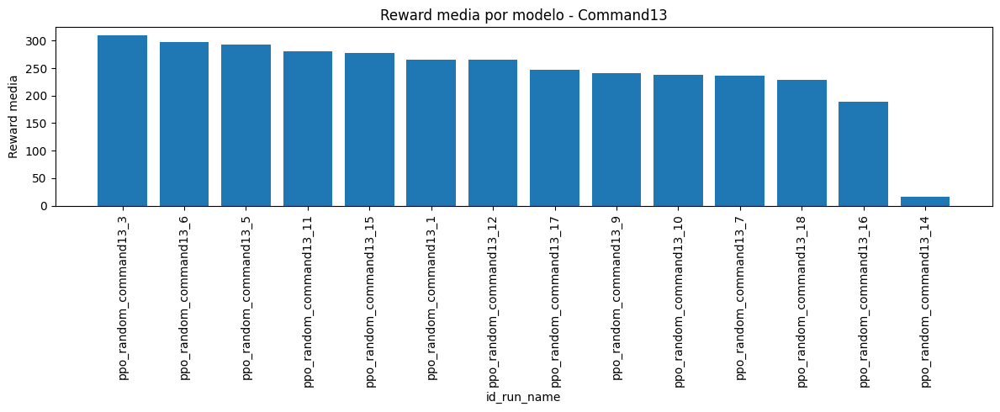

In [7]:
mean_rewards = df_results_grid_actions.groupby(["tarea", "id_run_name"])["reward"].mean()

for tarea, subdf in mean_rewards.groupby(level="tarea"):
    plt.figure(figsize=(12,5))
    
    # Convertir a DataFrame y resetear index para graficar
    plot_df = subdf.reset_index()
    plot_df = plot_df.sort_values("reward", ascending=False)
    
    plt.bar(plot_df["id_run_name"], plot_df["reward"])
    plt.title(f"Reward media por modelo - {tarea}")
    plt.xlabel("id_run_name")
    plt.ylabel("Reward media")
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()


In [8]:
df_callbacks = pd.read_csv(path_resultados+"/reward_best_models.csv",index_col='id_run_name')
top5_models = df_callbacks.nlargest(5,columns="reward")
top5_models

,iteration,reward,max_reward,std_reward,num_envs_train,mean_Episode_Reward/rew_attitude_stability2,mean_Episode_Reward/rew_ang_vel_stability4,mean_Episode_Reward/rew_pos2,mean_Episode_Reward/rew_action_rate,mean_Episode_Reward/rew_heading,mean_Episode_Reward/rew_track_vel3,mean_Episode_Termination/time_out,mean_Episode_Termination/below_min_altitude,mean_Episode_Termination/bad_attitude,mean_Episode_Termination/safety_shutdown
id_run_name,,,,,,,,,,,,,,,
ppo_random_command13_6,475,357.102291,389.386108,22.482617,8196,1.838823,0.948043,1.253390,-0.001268,2.573152,7.407162,0.965297,0.032858,0.001845,0.0
ppo_random_command13_5,676,354.212290,388.316284,19.452859,8196,1.838683,0.923107,1.338748,-0.021423,2.483640,7.395459,0.943373,0.053397,0.003230,0.0
ppo_random_command13_3,731,350.914468,389.283691,21.628483,8196,1.810713,0.913233,1.390522,-0.033674,2.364563,7.375736,0.941772,0.052382,0.005846,0.0
ppo_random_command13_12,291,346.534862,382.869965,26.803397,8196,1.834018,0.912221,1.169667,-0.051962,2.383274,7.317420,0.939774,0.057247,0.002979,0.0
ppo_random_command13_11,154,345.349527,376.282776,25.433491,8196,1.845975,0.918603,1.314418,-0.210983,2.453167,7.397715,0.942827,0.056562,0.000610,0.0


Graficamos cómo fue el entrenamiento para los 5 mejores modelos según los callbacks:

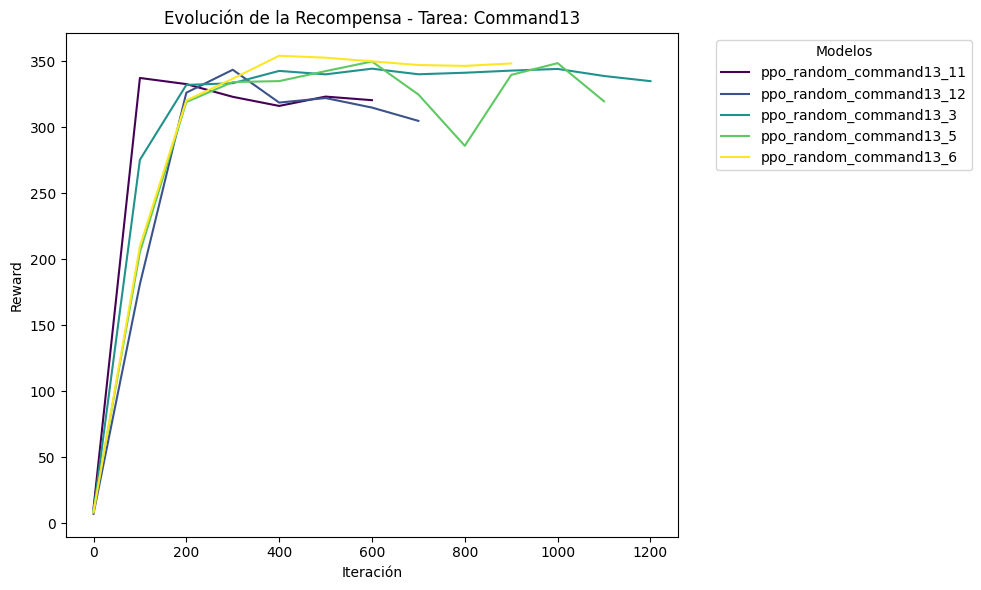

In [9]:
import matplotlib.pyplot as plt
import numpy as np

# Aseguramos que `top5_auc` tenga 'tarea' e 'id_run_name' como columnas, no solo en el índice
df_callbacks = pd.read_csv(path_resultados+"/reward_best_models.csv",index_col='id_run_name')
top5_models = df_callbacks.nlargest(5,columns="reward")
top5_reset = top5_models.reset_index()
top5_reset["tarea"] = top5_reset["id_run_name"].apply(get_group)


# Convertir el índice jerárquico en columnas (para acceder a 'tarea' y 'id_run_name')
df_copy_reset = df_copy.reset_index()

# Unimos `top5_auc_reset` con `df_copy_reset` en las columnas comunes: 'tarea' y 'id_run_name'
merged_df = pd.merge(df_copy_reset, top5_reset[['tarea', 'id_run_name']], on=['tarea', 'id_run_name'], how='inner')

# Usamos una lista de colores para asignar un color diferente a cada modelo
colors = plt.cm.viridis(np.linspace(0, 1, len(merged_df['id_run_name'].unique())))

# Ahora, procedemos a graficar
for tarea, task_df in merged_df.groupby('tarea'):
    plt.figure(figsize=(10, 6))
    
    # Iteramos sobre los modelos (id_run_name) para esta tarea
    for i, (run_name, subdf) in enumerate(task_df.groupby('id_run_name')):
        # Graficamos la evolución de la recompensa a lo largo de las iteraciones
        plt.plot(subdf['iteration'], subdf['reward'], label=run_name, color=colors[i])
    
    plt.xlabel('Iteración')
    plt.ylabel('Reward')
    plt.title(f'Evolución de la Recompensa - Tarea: {tarea}')
    plt.legend(title="Modelos", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()



``Cojo los 5 modelos mejores de todos de los callbacks``

In [10]:
import os
df_callbacks = pd.read_csv(path_resultados+"/reward_best_models.csv",index_col='id_run_name')
top5_models = df_callbacks.nlargest(5,columns="reward")

powershell_script_test = os.path.join(cfg_dir, "run_tests.ps1")

with open(powershell_script_test, "w") as f:
    f.write("$ErrorActionPreference = 'Stop'\n\n")
    
    for run_id, row in top5_models.iterrows():
        # Extraemos el número del id (ej: de 'ppo_random_hover_4' sacamos '4')
        experiment_number = run_id.split('_')[-1]
        
        # Construimos la ruta exacta del checkpoint
        # Nota: Asegúrate de que path_resultados termine en / o usar os.path.join
        checkpoint_path = f"{path_resultados}/best_model_{run_id}_{int(row['num_envs_train'])}.pt"
        f.write(f'Write-Host "Ejecutando Test final para Experimento {experiment_number}..."\n')
        
        # Usamos el experiment_number extraído para la tarea (--task)
        # Se añaden flags típicos de play.py: --num_envs 1 y se quita --headless para ver el visualizador
        f.write(f'& "{isaaclab_bat}" -p "{play_script}" '
                f'--task {id_task}-{experiment_number} '
                f'--num_envs 1 '
                f' --headless '
                f'--checkpoint "{checkpoint_path}"\n\n')
        
print(f"Script de test generado en: {powershell_script_test}")


Script de test generado en: C:/Users/Teresa/Documents/GitHub/navsim/isaac_lab/aerotaxi/env_command/env_17/grid_hiperparametros/cfg_files\run_tests.ps1


### Test con 1 entorno

In [11]:
# Ejecuta el entrenamiento de forma automática
# !powershell -ExecutionPolicy Bypass -File "{powershell_script}"
import subprocess
import sys

# Ruta al script que generaste
powershell_script_path = powershell_script_test 

print(f"Iniciando ejecución de: {powershell_script_path}\n")

# Ejecutamos el proceso capturando la salida en tiempo real
process = subprocess.Popen(
    ["powershell.exe", "-ExecutionPolicy", "Bypass", "-File", powershell_script_path],
    stdout=subprocess.PIPE,
    stderr=subprocess.STDOUT, # Redirigimos errores a la salida estándar para verlos
    text=True,
    bufsize=1
)

# Leemos la salida línea a línea conforme se genera
try:
    for line in process.stdout:
        print(line, end="") # Imprime la salida de PowerShell en la celda
        sys.stdout.flush()   # Fuerza a Jupyter a mostrar la línea inmediatamente
except KeyboardInterrupt:
    process.kill()
    print("\nEntrenamiento cancelado por el usuario.")

process.wait()
print("\n--- Todos los experimentos de test han finalizado ---")

Iniciando ejecución de: C:/Users/Teresa/Documents/GitHub/navsim/isaac_lab/aerotaxi/env_command/env_17/grid_hiperparametros/cfg_files\run_tests.ps1

Ejecutando Test final para Experimento 6...
[INFO] Using python from: C:\Users\Teresa\miniconda3\envs\env_isaaclab\python.exe
[INFO][AppLauncher]: Using device: cuda:0
[INFO][AppLauncher]: Loading experience file: C:\Users\Teresa\miniconda3\envs\env_isaaclab\Lib\site-packages\isaaclab\apps\isaaclab.python.headless.kit
Loading user config located at: 'c:/users/teresa/miniconda3/envs/env_isaaclab/lib/site-packages/isaacsim/kit/data/Kit/Isaac-Sim/5.1/user.config.json'
[Info] [carb] Logging to file: c:/users/teresa/miniconda3/envs/env_isaaclab/lib/site-packages/isaacsim/kit/logs/Kit/Isaac-Sim/5.1/kit_20260323_093905.log
2026-03-23T08:39:06Z s] [Warning] [omni.usd_config.extension] Enable omni.materialx.libs extension to use MaterialX
2026-03-23T08:39:07Z [1,728ms] [Warning] [carb] Acquiring non optional plugin interface which is not listed as d

In [10]:
df_callbacks = pd.read_csv(path_resultados+"/reward_best_models.csv",index_col='id_run_name')
top5_models = df_callbacks.nlargest(5,columns="reward")

In [11]:
df_rewards_play = pd.read_csv(path_resultados+'/rewards_play_PPO.csv')

In [12]:
df_rewards_play

,id_run_name,reward,max_reward,std,num_envs_test,checkpoint,mean_Episode_Reward/rew_attitude_stability2,mean_Episode_Reward/rew_ang_vel_stability4,mean_Episode_Reward/rew_pos2,mean_Episode_Reward/rew_action_rate,mean_Episode_Reward/rew_heading,mean_Episode_Reward/rew_track_vel3,mean_Episode_Termination/time_out,mean_Episode_Termination/below_min_altitude,mean_Episode_Termination/bad_attitude,mean_Episode_Termination/safety_shutdown
0,ppo_random_command13_6,284.744657,284.744657,0.000000,1,C:/Users/Teresa/Documents/GitHub/navsim/tmp/tm...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0
1,ppo_random_command13_5,255.398783,267.719877,12.321094,1,C:/Users/Teresa/Documents/GitHub/navsim/tmp/tm...,1.279652,0.653328,1.005073,-0.001023,1.590706,5.195369,0.0,1.000000,0.000000,0.0
2,ppo_random_command13_3,281.998948,281.998948,0.000000,1,C:/Users/Teresa/Documents/GitHub/navsim/tmp/tm...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0
3,ppo_random_command13_12,271.797671,271.797671,0.000000,1,C:/Users/Teresa/Documents/GitHub/navsim/tmp/tm...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0
4,ppo_random_command13_11,257.432946,257.432946,0.000000,1,C:/Users/Teresa/Documents/GitHub/navsim/tmp/tm...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0
5,ppo_random_command13_6,252.605836,311.861651,62.575502,256,C:/Users/Teresa/Documents/GitHub/navsim/tmp/tm...,1.177500,0.656842,0.309951,-0.000135,1.611632,4.915675,0.0,0.055640,0.059138,0.0
6,ppo_random_command13_5,245.353958,314.569506,73.463890,256,C:/Users/Teresa/Documents/GitHub/navsim/tmp/tm...,1.081259,0.617165,0.538599,-0.000890,1.596785,4.489739,0.0,0.056844,0.129477,0.0
7,ppo_random_command13_3,256.572141,310.663786,62.473383,256,C:/Users/Teresa/Documents/GitHub/navsim/tmp/tm...,1.272399,0.678870,0.750503,-0.001495,1.587763,5.265536,0.0,0.055354,0.055858,0.0
8,ppo_random_command13_12,262.535082,299.441030,39.858871,256,C:/Users/Teresa/Documents/GitHub/navsim/tmp/tm...,1.355854,0.691667,0.940130,-0.001394,1.747036,5.408531,0.0,0.038173,0.007740,0.0
9,ppo_random_command13_11,254.747265,306.459858,54.276812,256,C:/Users/Teresa/Documents/GitHub/navsim/tmp/tm...,1.009448,0.637424,0.110738,-0.002217,1.728173,4.520091,0.0,0.044572,0.063144,0.0


### Test con 64 entornos

In [15]:
import os
df_callbacks = pd.read_csv(path_resultados+"/reward_best_models.csv",index_col='id_run_name')
top5_models = df_callbacks.nlargest(5,columns="reward")

powershell_script_test_2 = os.path.join(cfg_dir, "run_tests_2.ps1")

with open(powershell_script_test_2, "w") as f:
    f.write("$ErrorActionPreference = 'Stop'\n\n")
    
    for run_id, row in top5_models.iterrows():
        # Extraemos el número del id (ej: de 'ppo_random_hover_4' sacamos '4')
        experiment_number = run_id.split('_')[-1]
        
        # Construimos la ruta exacta del checkpoint
        # Nota: Asegúrate de que path_resultados termine en / o usar os.path.join
        checkpoint_path = f"{path_resultados}/best_model_{run_id}_{int(row['num_envs_train'])}.pt"
        f.write(f'Write-Host "Ejecutando Test final para Experimento {experiment_number}..."\n')
        
        # Usamos el experiment_number extraído para la tarea (--task)
        # Se añaden flags típicos de play.py: --num_envs 1 y se quita --headless para ver el visualizador
        f.write(f'& "{isaaclab_bat}" -p "{play_script}" '
                f'--task {id_task}-{experiment_number} '
                f'--num_envs 256 '
                f' --headless '
                f'--checkpoint "{checkpoint_path}"\n\n')
        
print(f"Script de test generado en: {powershell_script_test_2}")


Script de test generado en: C:/Users/Teresa/Documents/GitHub/navsim/isaac_lab/aerotaxi/env_command/env_17/grid_hiperparametros/cfg_files\run_tests_2.ps1


In [16]:
# Ejecuta el entrenamiento de forma automática
# !powershell -ExecutionPolicy Bypass -File "{powershell_script}"
import subprocess
import sys

# Ruta al script que generaste
powershell_script_path = powershell_script_test_2 

print(f"Iniciando ejecución de: {powershell_script_path}\n")

# Ejecutamos el proceso capturando la salida en tiempo real
process = subprocess.Popen(
    ["powershell.exe", "-ExecutionPolicy", "Bypass", "-File", powershell_script_path],
    stdout=subprocess.PIPE,
    stderr=subprocess.STDOUT, # Redirigimos errores a la salida estándar para verlos
    text=True,
    bufsize=1
)

# Leemos la salida línea a línea conforme se genera
try:
    for line in process.stdout:
        print(line, end="") # Imprime la salida de PowerShell en la celda
        sys.stdout.flush()   # Fuerza a Jupyter a mostrar la línea inmediatamente
except KeyboardInterrupt:
    process.kill()
    print("\nEntrenamiento cancelado por el usuario.")

process.wait()
print("\n--- Todos los experimentos de test han finalizado ---")

Iniciando ejecución de: C:/Users/Teresa/Documents/GitHub/navsim/isaac_lab/aerotaxi/env_command/env_17/grid_hiperparametros/cfg_files\run_tests_2.ps1

Ejecutando Test final para Experimento 6...
[INFO] Using python from: C:\Users\Teresa\miniconda3\envs\env_isaaclab\python.exe
[INFO][AppLauncher]: Using device: cuda:0
[INFO][AppLauncher]: Loading experience file: C:\Users\Teresa\miniconda3\envs\env_isaaclab\Lib\site-packages\isaaclab\apps\isaaclab.python.headless.kit
Loading user config located at: 'c:/users/teresa/miniconda3/envs/env_isaaclab/lib/site-packages/isaacsim/kit/data/Kit/Isaac-Sim/5.1/user.config.json'
[Info] [carb] Logging to file: c:/users/teresa/miniconda3/envs/env_isaaclab/lib/site-packages/isaacsim/kit/logs/Kit/Isaac-Sim/5.1/kit_20260323_094153.log
2026-03-23T08:41:53Z s] [Warning] [omni.usd_config.extension] Enable omni.materialx.libs extension to use MaterialX
2026-03-23T08:41:54Z s] [Warning] [carb] Acquiring non optional plugin interface which is not listed as depend

#### Test con 256 entornos

In [17]:
import os
df_callbacks = pd.read_csv(path_resultados+"/reward_best_models.csv",index_col='id_run_name')
top5_models = df_callbacks.nlargest(5,columns="reward")

powershell_script_test_3 = os.path.join(cfg_dir, "run_tests_3.ps1")

with open(powershell_script_test_3, "w") as f:
    f.write("$ErrorActionPreference = 'Stop'\n\n")
    
    for run_id, row in top5_models.iterrows():
        # Extraemos el número del id (ej: de 'ppo_random_hover_4' sacamos '4')
        experiment_number = run_id.split('_')[-1]
        
        # Construimos la ruta exacta del checkpoint
        # Nota: Asegúrate de que path_resultados termine en / o usar os.path.join
        checkpoint_path = f"{path_resultados}/best_model_{run_id}_{int(row['num_envs_train'])}.pt"
        f.write(f'Write-Host "Ejecutando Test final para Experimento {experiment_number}..."\n')
        
        # Usamos el experiment_number extraído para la tarea (--task)
        # Se añaden flags típicos de play.py: --num_envs 1 y se quita --headless para ver el visualizador
        f.write(f'& "{isaaclab_bat}" -p "{play_script}" '
                f'--task {id_task}-{experiment_number} '
                f'--num_envs 1024 '
                f' --headless '
                f'--checkpoint "{checkpoint_path}"\n\n')
        
print(f"Script de test generado en: {powershell_script_test_3}")


Script de test generado en: C:/Users/Teresa/Documents/GitHub/navsim/isaac_lab/aerotaxi/env_command/env_17/grid_hiperparametros/cfg_files\run_tests_3.ps1


In [18]:
# Ejecuta el entrenamiento de forma automática
# !powershell -ExecutionPolicy Bypass -File "{powershell_script}"
import subprocess
import sys

# Ruta al script que generaste
powershell_script_path = powershell_script_test_3 

print(f"Iniciando ejecución de: {powershell_script_path}\n")

# Ejecutamos el proceso capturando la salida en tiempo real
process = subprocess.Popen(
    ["powershell.exe", "-ExecutionPolicy", "Bypass", "-File", powershell_script_path],
    stdout=subprocess.PIPE,
    stderr=subprocess.STDOUT, # Redirigimos errores a la salida estándar para verlos
    text=True,
    bufsize=1
)

# Leemos la salida línea a línea conforme se genera
try:
    for line in process.stdout:
        print(line, end="") # Imprime la salida de PowerShell en la celda
        sys.stdout.flush()   # Fuerza a Jupyter a mostrar la línea inmediatamente
except KeyboardInterrupt:
    process.kill()
    print("\nEntrenamiento cancelado por el usuario.")

process.wait()
print("\n--- Todos los experimentos de test han finalizado ---")

Iniciando ejecución de: C:/Users/Teresa/Documents/GitHub/navsim/isaac_lab/aerotaxi/env_command/env_17/grid_hiperparametros/cfg_files\run_tests_3.ps1

Ejecutando Test final para Experimento 6...
[INFO] Using python from: C:\Users\Teresa\miniconda3\envs\env_isaaclab\python.exe
[INFO][AppLauncher]: Using device: cuda:0
[INFO][AppLauncher]: Loading experience file: C:\Users\Teresa\miniconda3\envs\env_isaaclab\Lib\site-packages\isaaclab\apps\isaaclab.python.headless.kit
Loading user config located at: 'c:/users/teresa/miniconda3/envs/env_isaaclab/lib/site-packages/isaacsim/kit/data/Kit/Isaac-Sim/5.1/user.config.json'
[Info] [carb] Logging to file: c:/users/teresa/miniconda3/envs/env_isaaclab/lib/site-packages/isaacsim/kit/logs/Kit/Isaac-Sim/5.1/kit_20260323_094448.log
2026-03-23T08:44:48Z s] [Warning] [omni.usd_config.extension] Enable omni.materialx.libs extension to use MaterialX
2026-03-23T08:44:48Z s] [Warning] [carb] Acquiring non optional plugin interface which is not listed as depend

In [13]:
import pandas as pd

df_train = top5_models.copy()
if df_train.index.name == 'id_run_name':
    df_train = df_train.reset_index()

df_train = df_train.rename(columns={
    'reward': 'reward_train',
    'max_reward': 'max_reward_train',
    'std_reward': 'std_train'
})

df_test = df_rewards_play.copy()

df_test = pd.read_csv(path_resultados+'/rewards_play_PPO.csv')
df_test = df_test.rename(columns={
    'reward': 'reward_test',
    'max_reward': 'max_reward_test',
    'std': 'std_test'
})

df_final = pd.merge(
    df_train[['id_run_name', 'num_envs_train', 'reward_train', 'max_reward_train', 'std_train', 'iteration']], 
    df_test[['id_run_name', 'num_envs_test', 'reward_test', 'max_reward_test', 'std_test', 'checkpoint']], 
    on='id_run_name', 
    how='inner'
)

column_order = [
    'id_run_name',
    'num_envs_train',
    'num_envs_test',
    'reward_train', 'reward_test', 
    'max_reward_train', 'max_reward_test', 
    'std_train', 'std_test',
    'iteration'
]
df_final = df_final[column_order]

df_final = df_final.sort_values(by='id_run_name', ascending=False)

In [14]:
df_rewards_play = df_final.sort_values(by="id_run_name",ascending=False)
df_rewards_play = df_rewards_play.reset_index().drop(columns='index')

df_final = df_rewards_play.copy()

df_final['diff_rw_test_train'] = df_final['reward_test'] - df_final['reward_train']

df_final['diferencia(%)'] = (df_final['diff_rw_test_train'] / df_final['reward_train'].abs()) * 100

df_final['diferencia(%)'] = df_final['diferencia(%)'].apply(lambda x: f"{x:+.2f}%")

df_final

,id_run_name,num_envs_train,num_envs_test,reward_train,reward_test,max_reward_train,max_reward_test,std_train,std_test,iteration,diff_rw_test_train,diferencia(%)
0,ppo_random_command13_6,8196,1,357.102291,284.744657,389.386108,284.744657,22.482617,0.000000,475,-72.357634,-20.26%
1,ppo_random_command13_6,8196,256,357.102291,252.605836,389.386108,311.861651,22.482617,62.575502,475,-104.496455,-29.26%
2,ppo_random_command13_6,8196,1024,357.102291,254.466364,389.386108,311.637242,22.482617,59.771569,475,-102.635927,-28.74%
3,ppo_random_command13_6,8196,8196,357.102291,252.922819,389.386108,313.469750,22.482617,61.940452,475,-104.179472,-29.17%
4,ppo_random_command13_5,8196,1,354.212290,255.398783,388.316284,267.719877,19.452859,12.321094,676,-98.813507,-27.90%
5,ppo_random_command13_5,8196,256,354.212290,245.353958,388.316284,314.569506,19.452859,73.463890,676,-108.858332,-30.73%
6,ppo_random_command13_5,8196,1024,354.212290,250.499574,388.316284,314.629752,19.452859,64.799710,676,-103.712717,-29.28%
7,ppo_random_command13_5,8196,8196,354.212290,249.770307,388.316284,315.469876,19.452859,67.098856,676,-104.441984,-29.49%
8,ppo_random_command13_3,8196,1,350.914468,281.998948,389.283691,281.998948,21.628483,0.000000,731,-68.915520,-19.64%
9,ppo_random_command13_3,8196,256,350.914468,256.572141,389.283691,310.663786,21.628483,62.473383,731,-94.342327,-26.88%


Pruebas con un solo entorno: Vemos cómo se comporta la política para un único agente en una prueba aleatoria.

In [15]:
df_final[df_final['num_envs_test'] == 1].sort_values(by='reward_test',ascending=False)

,id_run_name,num_envs_train,num_envs_test,reward_train,reward_test,max_reward_train,max_reward_test,std_train,std_test,iteration,diff_rw_test_train,diferencia(%)
0,ppo_random_command13_6,8196,1,357.102291,284.744657,389.386108,284.744657,22.482617,0.000000,475,-72.357634,-20.26%
8,ppo_random_command13_3,8196,1,350.914468,281.998948,389.283691,281.998948,21.628483,0.000000,731,-68.915520,-19.64%
12,ppo_random_command13_12,8196,1,346.534862,271.797671,382.869965,271.797671,26.803397,0.000000,291,-74.737191,-21.57%
16,ppo_random_command13_11,8196,1,345.349527,257.432946,376.282776,257.432946,25.433491,0.000000,154,-87.916581,-25.46%
4,ppo_random_command13_5,8196,1,354.212290,255.398783,388.316284,267.719877,19.452859,12.321094,676,-98.813507,-27.90%


``Interpretación``: Vemos que el modelo 38 se ha estampado en la prueba aleatoria, así que ese modelo no debería usarse para ninguna transferencia real.

Pruebas con varios entornos: Vemos cómo se comporta la política en múltiples entornos (varias pruebas simuladas en paralelo), teniendo en cuenta cuál es la desviación de cada uno en test, lo que nos permite inferir si la recompensa es estable para todas las pruebas.

In [16]:
df_final[df_final['num_envs_test'] != 1].sort_values(by='std_test',ascending=True).reset_index().drop(columns="index")

,id_run_name,num_envs_train,num_envs_test,reward_train,reward_test,max_reward_train,max_reward_test,std_train,std_test,iteration,diff_rw_test_train,diferencia(%)
0,ppo_random_command13_12,8196,1024,346.534862,262.780838,382.869965,300.868440,26.803397,39.022065,291,-83.754024,-24.17%
1,ppo_random_command13_12,8196,256,346.534862,262.535082,382.869965,299.441030,26.803397,39.858871,291,-83.999780,-24.24%
2,ppo_random_command13_12,8196,8196,346.534862,261.331710,382.869965,304.617797,26.803397,43.312773,291,-85.203153,-24.59%
3,ppo_random_command13_11,8196,8196,345.349527,259.825891,376.282776,310.457913,25.433491,49.504331,154,-85.523636,-24.76%
4,ppo_random_command13_11,8196,1024,345.349527,258.389917,376.282776,310.060243,25.433491,51.348912,154,-86.959610,-25.18%
5,ppo_random_command13_11,8196,256,345.349527,254.747265,376.282776,306.459858,25.433491,54.276812,154,-90.602263,-26.23%
6,ppo_random_command13_3,8196,1024,350.914468,259.533131,389.283691,310.271274,21.628483,55.432095,731,-91.381337,-26.04%
7,ppo_random_command13_3,8196,8196,350.914468,258.958016,389.283691,312.811257,21.628483,57.286705,731,-91.956452,-26.20%
8,ppo_random_command13_6,8196,1024,357.102291,254.466364,389.386108,311.637242,22.482617,59.771569,475,-102.635927,-28.74%
9,ppo_random_command13_6,8196,8196,357.102291,252.922819,389.386108,313.469750,22.482617,61.940452,475,-104.179472,-29.17%


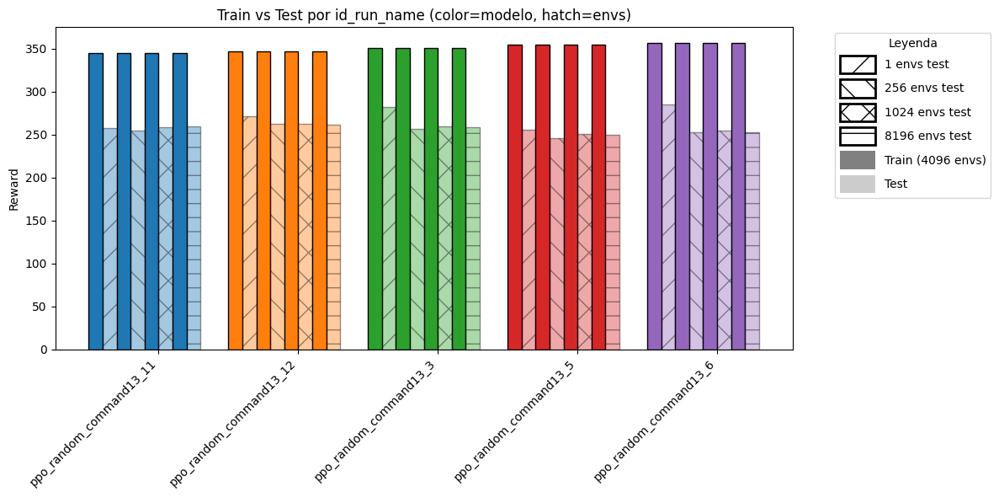

In [17]:
from matplotlib.patches import Patch

# Ordenar
df = df_final.sort_values(by=["id_run_name", "num_envs_test"])

groups = df["id_run_name"].unique()
envs_test_vals = sorted(df["num_envs_test"].unique())

x = np.arange(len(groups))

fig, ax = plt.subplots(figsize=(12,6))

colors = plt.cm.tab10.colors
hatches = ['/', '\\', 'x', '-', '+', 'o', 'O', '.', '*']

# Mapa de hatch por num_envs_test
hatch_map = {
    env: hatches[i % len(hatches)] 
    for i, env in enumerate(envs_test_vals)
}

for i, group in enumerate(groups):
    subset = df[df["id_run_name"] == group]
    n = len(subset)
    
    for j, (_, row) in enumerate(subset.iterrows()):
        offset = (j - n/2) * (0.8 / n)
        width = (0.8 / n) / 2
        
        base_color = colors[i % len(colors)]
        

        ax.bar(
            i + offset - width/2,
            row["reward_train"],
            width=width,
            color=base_color,
            alpha=1.0,
            edgecolor='black'
        )
        
        ax.bar(
            i + offset + width/2,
            row["reward_test"],
            width=width,
            color=base_color,
            alpha=0.4,
            hatch=hatch_map[row["num_envs_test"]],
            edgecolor='black'
        )

# Etiquetas eje X
ax.set_xticks(x)
ax.set_xticklabels(groups, rotation=45, ha='right')
ax.set_ylabel("Reward")
ax.set_title("Train vs Test por id_run_name (color=modelo, hatch=envs)")


legend_hatch = [
    Patch(facecolor='white',
          edgecolor='black',
          hatch=hatch_map[env],
          linewidth=2,
          label=f"{env} envs test")
    for env in envs_test_vals
]

legend_tt = [
    Patch(facecolor='gray', alpha=1.0, label="Train (4096 envs)"),
    Patch(facecolor='gray', alpha=0.4, label="Test")
]

# Combinar leyendas
ax.legend(
    handles=legend_hatch + legend_tt,
    title="Leyenda",
    bbox_to_anchor=(1.05, 1),
    loc='upper left',
    handleheight=2,
    handlelength=3
)

plt.tight_layout()
plt.show()

In [18]:
import pandas as pd

# ==========================================
# 1. Filtrar experimentos válidos (sin num_envs_test == 1)
# ==========================================

df_eval = (
    df_final[df_final['num_envs_test'] != 1]
    .sort_values(by='std_test', ascending=True)
    .reset_index(drop=True)
)

# ==========================================
# 2. Seleccionar columnas necesarias del CSV original
# ==========================================

reward_cols = [
    'id_run_name',
    'num_envs_test',
    'mean_Episode_Reward/rew_attitude_stability2',
    'mean_Episode_Reward/rew_ang_vel_stability4',
    'mean_Episode_Reward/rew_pos2',
    'mean_Episode_Reward/rew_action_rate',
    'mean_Episode_Reward/rew_heading',
    'mean_Episode_Reward/rew_track_vel3',
    'mean_Episode_Termination/below_min_altitude',
    'mean_Episode_Termination/bad_attitude',
    'mean_Episode_Termination/safety_shutdown'
]

df_metrics = pd.read_csv(path_resultados+'/rewards_play_PPO.csv')

# ==========================================
# 3. Crear métricas compuestas
# ==========================================

# Estabilidad actitudinal
df_metrics['stability_score'] = (
    df_metrics['mean_Episode_Reward/rew_attitude_stability2'] +
    df_metrics['mean_Episode_Reward/rew_ang_vel_stability4']
)

# Calidad de seguimiento
df_metrics['tracking_score'] = (
    df_metrics['mean_Episode_Reward/rew_pos2'] +
    df_metrics['mean_Episode_Reward/rew_heading'] +
    df_metrics['mean_Episode_Reward/rew_track_vel3']
)

# Suavidad del control
# (como rew_action_rate es penalización negativa)
df_metrics['smoothness_score'] = (
    -df_metrics['mean_Episode_Reward/rew_action_rate']
)

# Tasa de fallo
df_metrics['failure_rate'] = (
    df_metrics['mean_Episode_Termination/below_min_altitude'] +
    df_metrics['mean_Episode_Termination/bad_attitude'] +
    df_metrics['mean_Episode_Termination/safety_shutdown']
)

# Tasa de éxito
df_metrics['success_rate'] = 1 - df_metrics['failure_rate']

# ==========================================
# 4. Coeficiente de variación (robustez)
# ==========================================

df_eval['cv_test'] = df_eval['std_test'] / df_eval['reward_test']

# ==========================================
# 5. Merge con resultados finales
# ==========================================

df_result = df_eval.merge(
    df_metrics[
        [
            'id_run_name',
            'num_envs_test',
            'stability_score',
            'tracking_score',
            'smoothness_score',
            'failure_rate',
            'success_rate'
        ]
    ],
    on=['id_run_name', 'num_envs_test'],
    how='left'
)

# ==========================================
# 6. Ordenar por mejor reward y menor fallo
# ==========================================

df_result = df_result.sort_values(
    by=['reward_test', 'failure_rate'],
    ascending=[False, True]
).reset_index(drop=True)

df_plot = df_result.copy()

def normalize(x, xmin, xmax, invert=False):
    x_norm = (x - xmin) / (xmax - xmin)
    x_norm = np.clip(x_norm, 0, 1)

    if invert:
        x_norm = 1 - x_norm

    return x_norm

# ======================================
# Escalado interpretable [0,1]
# ======================================

df_plot["stability_scaled"] = normalize(
    df_plot["stability_score"],
    xmin=1.6,
    xmax=2.2
)

df_plot["tracking_scaled"] = normalize(
    df_plot["tracking_score"],
    xmin=6.0,
    xmax=9.0
)

df_plot["smoothness_scaled"] = normalize(
    df_plot["smoothness_score"],
    xmin=0.0001,
    xmax=0.006,
    invert=True
)

df_plot["failure_scaled"] = normalize(
    df_plot["failure_rate"],
    xmin=0.0,
    xmax=0.2,
    invert=True
)

df_plot["success_scaled"] = normalize(
    df_plot["success_rate"],
    xmin=0.8,
    xmax=1.0
)

df_plot["robustness_scaled"] = normalize(
    df_plot["cv_test"],
    xmin=0.1,
    xmax=0.3,
    invert=True
)

# Opcional: pasar a 0-100
scaled_cols = [
    "stability_scaled",
    "tracking_scaled",
    "smoothness_scaled",
    "failure_scaled",
    "success_scaled",
    "robustness_scaled"
]

for col in scaled_cols:
    df_plot[col.replace("_scaled", "_pct")] = df_plot[col] * 100

df_plot

,id_run_name,num_envs_train,num_envs_test,reward_train,reward_test,max_reward_train,max_reward_test,std_train,std_test,iteration,...,smoothness_scaled,failure_scaled,success_scaled,robustness_scaled,stability_pct,tracking_pct,smoothness_pct,failure_pct,success_pct,robustness_pct
0,ppo_random_command13_12,8196,1024,346.534862,262.780838,382.869965,300.868440,26.803397,39.022065,291,...,0.749830,0.710466,0.710466,0.757517,95.271305,75.541362,74.982976,71.046630,71.046630,75.751693
1,ppo_random_command13_12,8196,256,346.534862,262.535082,382.869965,299.441030,26.803397,39.858871,291,...,0.780707,0.770435,0.770435,0.740885,74.586755,69.856550,78.070706,77.043493,77.043493,74.088487
2,ppo_random_command13_12,8196,8196,346.534862,261.331710,382.869965,304.617797,26.803397,43.312773,291,...,0.831709,0.682454,0.682454,0.671307,63.918972,46.927761,83.170927,68.245350,68.245350,67.130659
3,ppo_random_command13_11,8196,8196,345.349527,259.825891,376.282776,310.457913,25.433491,49.504331,154,...,0.113783,0.624263,0.624263,0.547356,69.251202,57.672289,11.378294,62.426298,62.426298,54.735569
4,ppo_random_command13_3,8196,1024,350.914468,259.533131,389.283691,310.271274,21.628483,55.432095,731,...,0.678290,0.440063,0.440063,0.432081,92.466150,94.591049,67.828951,44.006294,44.006294,43.208056
5,ppo_random_command13_3,8196,8196,350.914468,258.958016,389.283691,312.811257,21.628483,57.286705,731,...,0.691239,0.419780,0.419780,0.393900,56.510193,61.032384,69.123912,41.977958,41.977958,39.389976
6,ppo_random_command13_11,8196,1024,345.349527,258.389917,376.282776,310.060243,25.433491,51.348912,154,...,0.000000,0.628199,0.628199,0.506368,58.058190,57.310443,0.000000,62.819924,62.819924,50.636773
7,ppo_random_command13_3,8196,256,350.914468,256.572141,389.283691,310.663786,21.628483,62.473383,731,...,0.763514,0.443938,0.443938,0.282538,58.544855,53.460065,76.351430,44.393783,44.393783,28.253768
8,ppo_random_command13_11,8196,256,345.349527,254.747265,376.282776,306.459858,25.433491,54.276812,154,...,0.641217,0.461417,0.461417,0.434693,7.811936,11.966690,64.121702,46.141721,46.141721,43.469294
9,ppo_random_command13_6,8196,1024,357.102291,254.466364,389.386108,311.637242,22.482617,59.771569,475,...,0.991172,0.405020,0.405020,0.325551,21.235356,40.498682,99.117210,40.502041,40.502041,32.555070


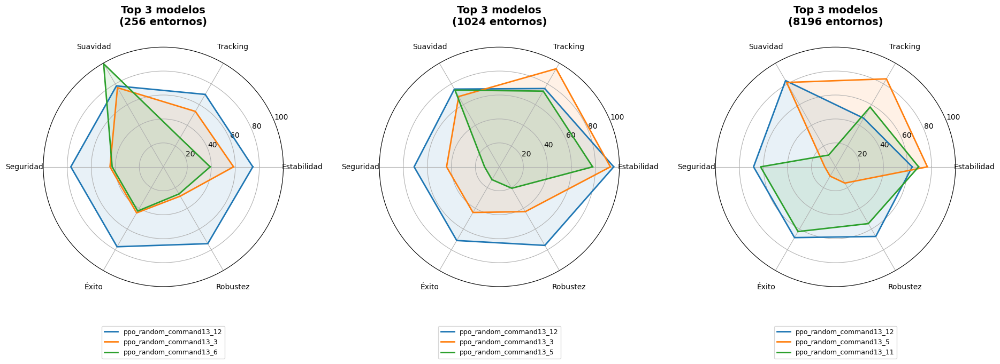

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

metrics = [
    "stability_pct",
    "tracking_pct",
    "smoothness_pct",
    "failure_pct",
    "success_pct",
    "robustness_pct"
]

labels = [
    "Estabilidad",
    "Tracking",
    "Suavidad",
    "Seguridad",
    "Éxito",
    "Robustez"
]

TEST_ENVS = [256, 1024, 8196]


def rank_models(df, test_env):
    """
    Filtra un entorno de test concreto y rankea modelos
    """

    df_same_test = df[df["num_envs_test"] == test_env].copy()

    df_same_test["global_score"] = (
        0.35 * df_same_test["tracking_pct"] +
        0.25 * df_same_test["success_pct"] +
        0.20 * df_same_test["stability_pct"] +
        0.10 * df_same_test["robustness_pct"] +
        0.10 * df_same_test["smoothness_pct"]
    )

    df_ranked = (
        df_same_test
        .sort_values(by="global_score", ascending=False)
        .reset_index(drop=True)
    )

    return df_ranked


def compare_radar(ax, df, rows, title):
    """
    Dibuja radar chart optimizado para legibilidad
    """
    angles = np.linspace(0, 2*np.pi, len(metrics), endpoint=False)
    angles = np.concatenate([angles, [angles[0]]])

    for row_idx in rows:
        values = df.loc[row_idx, metrics].values.astype(float)
        values = np.concatenate([values, [values[0]]])
        label = df.loc[row_idx, "id_run_name"]

        ax.plot(angles, values, linewidth=2, label=label)
        ax.fill(angles, values, alpha=0.1)

    # Corregir etiquetas: añadimos padding para que no entren en el círculo
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels)
    ax.tick_params(axis='x', pad=15) # Aleja los nombres (Estabilidad, etc.) del círculo

    ax.set_ylim(0, 100)
    ax.set_title(title, pad=30, fontsize=14, fontweight='bold')

    # Leyenda debajo del gráfico para que no tape el Tracking
    ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), 
              ncol=1, frameon=True, fontsize=9)

# ==========================================
# Crear figura con 3 radares (Reorganizado)
# ==========================================

fig, axes = plt.subplots(
    1, 3, 
    figsize=(22, 8), # Un poco más de ancho para dar aire
    subplot_kw=dict(polar=True)
)

for i, test_env in enumerate(TEST_ENVS):
    df_ranked = rank_models(df_plot, test_env)
    top3_idx = df_ranked.index[:3].tolist()

    compare_radar(
        axes[i],
        df_ranked,
        top3_idx,
        f"Top 3 modelos\n({test_env} entornos)" # Salto de línea en título
    )

# Ajuste manual del espacio para que las leyendas inferiores no se corten
plt.subplots_adjust(bottom=0.2, top=0.85, wspace=0.4)
plt.show()

### Análisis de Rendimiento de Modelos PPO (Isaac Lab)

| Característica | Diagnóstico |
| :--- | :--- |
| **Generalización** | **Buena en el modelo 12.** El hecho de que el Top 3 cambie según el número de entornos de test sugiere que algunos modelos sufrieron un ligero sobreajuste (*overfitting*) a las condiciones de entrenamiento. |
| **Trade-off Suavidad/Precisión** | Existe un claro conflicto en los modelos: los que son muy suaves (como el 6) tienden a ser peores siguiendo el objetivo, y los que clavan la posición (como el 5) tienen un control más ruidoso. |
| **Estabilidad de la métrica** | La métrica `global_score` parece penalizar mucho el `failure_rate`, lo cual es correcto para drones reales. El modelo 12 gana porque es el que menos veces "se estrella" o entra en estados prohibidos. |

C:/Users/Teresa/Desktop/RuralData/IsaacLab/IsaacLab/isaaclab.bat -p C:/Users/Teresa/Documents/GitHub/navsim/isaac_lab/rl_v5_1_0/rsl_rl/train.py --task Isaac-Command5-Aerotaxi-RANDOM-11 --num_envs 8196 --headless 

C:/Users/Teresa/Desktop/RuralData/IsaacLab/IsaacLab/isaaclab.bat -p C:/Users/Teresa/Documents/GitHub/navsim/isaac_lab/rl_v5_1_0/rsl_rl/play.py --task Isaac-Command11-Aerotaxi-RANDOM-11 --num_envs 256 --checkpoint C:/Users/Teresa/Documents/GitHub/navsim/tmp/tmpTeresa/resultados_grid_command_v11/best_model_ppo_random_command11_11_4096.pt


C:/Users/Teresa/Desktop/RuralData/IsaacLab/IsaacLab/isaaclab.bat -p C:/Users/Teresa/Documents/GitHub/navsim/isaac_lab/rl_v5_1_0/rsl_rl/play.py --task Isaac-Command13-Aerotaxi-RANDOM-12 --num_envs 256 --checkpoint C:/Users/Teresa/Documents/GitHub/navsim/tmp/tmpTeresa/resultados_grid_command_v17/best_model_ppo_random_command13_12_4096.pt